# FSDP2 Fully Sharded

I never use FSDP2 before actually, the first time I tried FSDP1, there are lot of memory issues and DeepSpeed pretty much straight forward compared to FSDP1, since then I never bothered to try FSDP from PyTorch.

In [1]:
import jupytertracerviz
from jupytertracerviz import init_multigpus_repl, multigpus

init_multigpus_repl()

In [2]:
%%multigpus

import torch
import torch.nn as nn
import torch.nn.functional as F

class SimpleDeepNet(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, num_layers):
        super(SimpleDeepNet, self).__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim)

        layers = [nn.Linear(embedding_dim, hidden_dim), nn.ReLU()]
        
        for _ in range(num_layers - 1):
            layers.append(nn.Linear(hidden_dim, hidden_dim))
            layers.append(nn.ReLU())

        self.hidden_layers = nn.Sequential(*layers)
        self.output_layer = nn.Linear(hidden_dim, vocab_size)

    def forward(self, x):
        x = self.embedding(x)
        x = x.mean(dim=1)
        x = self.hidden_layers(x)
        logits = self.output_layer(x)
        return logits
        
model_hidden_size = 8192
vocab_size = 200000

In [3]:
!nvidia-smi

Sat Apr 19 00:07:49 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 555.42.06              Driver Version: 555.42.06      CUDA Version: 12.5     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 3090 Ti     Off |   00000000:01:00.0 Off |                  Off |
| 30%   36C    P8             28W /  400W |      34MiB /  24564MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [4]:
%%multigpus

from torch.distributed._composable.fsdp import fully_shard, MixedPrecisionPolicy

with torch.device("meta"):
    model = SimpleDeepNet(vocab_size, model_hidden_size, model_hidden_size, 1).to(torch.bfloat16)
    
fully_shard(model)
model.to_empty(device = 'cuda')

In [5]:
!nvidia-smi

Sat Apr 19 00:07:50 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 555.42.06              Driver Version: 555.42.06      CUDA Version: 12.5     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 3090 Ti     Off |   00000000:01:00.0 Off |                  Off |
| 30%   38C    P0             44W /  400W |    2430MiB /  24564MiB |      1%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [6]:
%%multigpus

model

[GPU 1] FSDPSimpleDeepNet(
  (embedding): Embedding(200000, 8192)
  (hidden_layers): Sequential(
    (0): Linear(in_features=8192, out_features=8192, bias=True)
    (1): ReLU()
  )
  (output_layer): Linear(in_features=8192, out_features=200000, bias=True)
)
[GPU 2] FSDPSimpleDeepNet(
  (embedding): Embedding(200000, 8192)
  (hidden_layers): Sequential(
    (0): Linear(in_features=8192, out_features=8192, bias=True)
    (1): ReLU()
  )
  (output_layer): Linear(in_features=8192, out_features=200000, bias=True)
)
[GPU 0] FSDPSimpleDeepNet(
  (embedding): Embedding(200000, 8192)
  (hidden_layers): Sequential(
    (0): Linear(in_features=8192, out_features=8192, bias=True)
    (1): ReLU()
  )
  (output_layer): Linear(in_features=8192, out_features=200000, bias=True)
)


In [7]:
%%multigpus

model.output_layer.weight

[GPU 2] DTensor(local_tensor=tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:2', dtype=torch.bfloat16), device_mesh=DeviceMesh('cuda', [0, 1, 2]), placements=(Shard(dim=0),))
[GPU 0] DTensor(local_tensor=tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0', dtype=torch.bfloat16), device_mesh=DeviceMesh('cuda', [0, 1, 2]), placements=(Shard(dim=0),))
[GPU 1] DTensor(local_tensor=tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0

In [8]:
%%multigpus

from torch.distributed.optim import ZeroRedundancyOptimizer
import os

local_rank = os.environ.get('LOCAL_RANK')

criterion = nn.MSELoss()

batch_size = 16
seq_len = 8192
input_ids = torch.randint(0, vocab_size, (batch_size, seq_len)).cuda()
target = torch.randn(batch_size, vocab_size, dtype = torch.bfloat16).cuda()
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=0.01)

with torch.profiler.profile(
    activities=[
        torch.profiler.ProfilerActivity.CPU,
        torch.profiler.ProfilerActivity.CUDA,
    ],
    record_shapes = True, profile_memory = True,
) as prof:
    for i in range(1):
        optimizer.zero_grad()
        output = model(input_ids)
        loss = criterion(output, target)
        loss.backward()
        print(i, loss)

        optimizer.step()
    
    
prof.export_chrome_trace(f'fsdp2_training_{local_rank}.json')

[GPU 0] 0 tensor(0.9844, device='cuda:0', dtype=torch.bfloat16,
       grad_fn=<MseLossBackward0>)
[GPU 1] 0 tensor(0.9844, device='cuda:1', dtype=torch.bfloat16,
       grad_fn=<MseLossBackward0>)
[GPU 2] 0 tensor(0.9844, device='cuda:2', dtype=torch.bfloat16,
       grad_fn=<MseLossBackward0>)


Dumping trace data, total entries: 17708


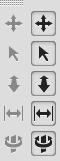
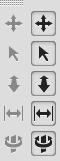
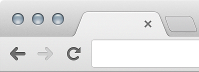
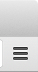
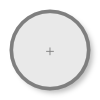
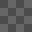
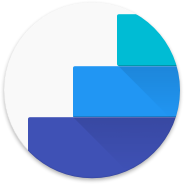
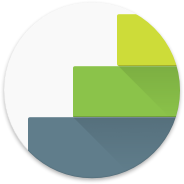
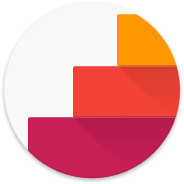
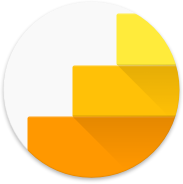

In [9]:
from glob import glob

jupytertracerviz.visualize(glob('fsdp2_training_*.json'), height = "800")